In [1]:
import cv2               as cv
import matplotlib.pyplot as plt
import numpy             as np
import pandas            as pd
import os
import time

from skimage.filters import gaussian
from skimage.segmentation import active_contour

DATASET_PATH = '../input/wound-dataset/Wound_dataset/'

def pick(data, number):
    parent = data.capitalize()
    child = data.lower()
    if parent == 'Ingrown_nails':
        child = 'ingrown_nail'
    if parent == 'Laceration':
        child = 'laseration'
    path = DATASET_PATH + parent + '/' + child + ' (' + str(number) + ').jpg'
    if not os.path.exists(path):
        print('')
    return path

citra = cv.imread(pick('cut', 15))

## Pre-processing

### Grayscaling

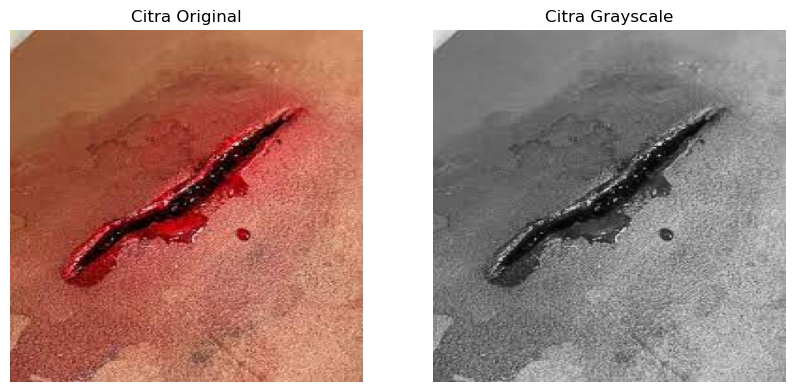

In [2]:
citra_grayscale = cv.cvtColor(citra, cv.COLOR_BGR2GRAY)

fig, axes = plt.subplots(1, 2,figsize=(10, 5))
axes[0].imshow(cv.cvtColor(citra, cv.COLOR_BGR2RGB))
axes[0].set_title("Citra Original")
axes[0].axis('off')
axes[1].imshow(citra_grayscale, cmap='gray')
axes[1].set_title("Citra Grayscale")
axes[1].axis('off')
plt.show()

### Pencerahan

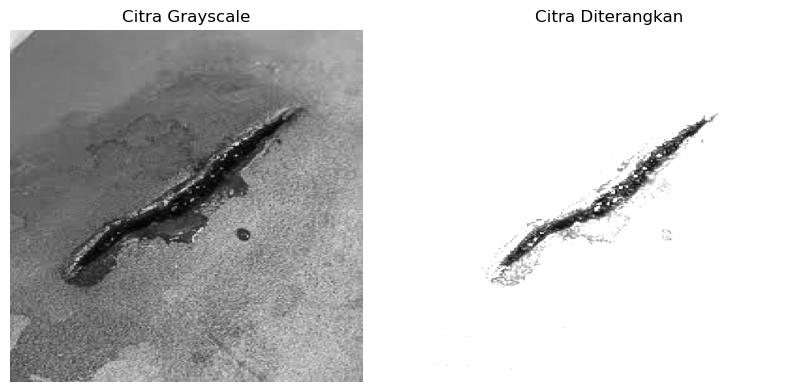

In [3]:
brightness = 200
citra_brightened = cv.add(citra_grayscale, brightness)

fig, axes = plt.subplots(1, 2,figsize=(10, 5))
axes[0].imshow(citra_grayscale, cmap='gray')
axes[0].set_title("Citra Grayscale")
axes[0].axis('off')
axes[1].imshow(citra_brightened, cmap='gray')
axes[1].set_title("Citra Diterangkan")
axes[1].axis('off')
plt.show()

### Denoising Citra

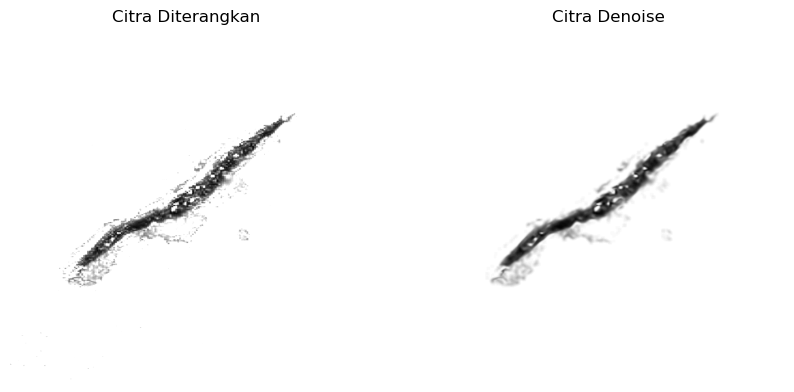

In [4]:
citra_denoise = cv.medianBlur(citra_brightened, 3)
citra_denoise = cv.fastNlMeansDenoising(citra_denoise, None, 10, 10, 7)

fig, axes = plt.subplots(1, 2,figsize=(10, 5))
axes[0].imshow(citra_brightened, cmap='gray')
axes[0].set_title("Citra Diterangkan")
axes[0].axis('off')
axes[1].imshow(citra_denoise, cmap='gray')
axes[1].set_title("Citra Denoise")
axes[1].axis('off')
plt.show()

### Penyesuaian Kontras

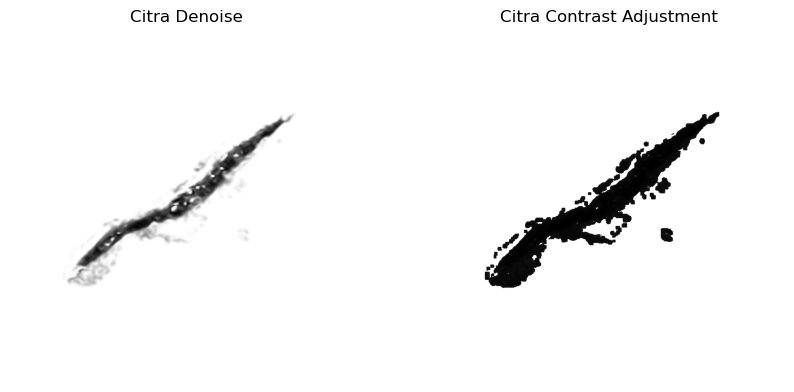

In [5]:
citra_contrast_adjusted = cv.equalizeHist(citra_denoise)

fig, axes = plt.subplots(1, 2,figsize=(10, 5))
axes[0].imshow(citra_denoise, cmap='gray')
axes[0].set_title("Citra Denoise")
axes[0].axis('off')
axes[1].imshow(citra_contrast_adjusted, cmap='gray')
axes[1].set_title("Citra Contrast Adjustment")
axes[1].axis('off')
plt.show()

### Segmentasi dengan Active Contour

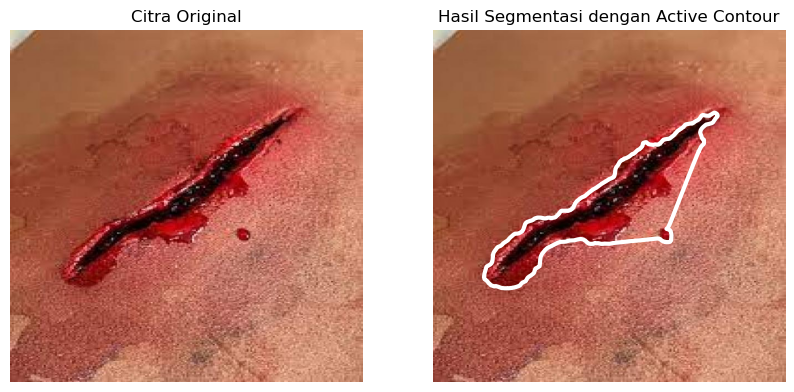

MSE : 107.27428466796874
PSNR: 13.912923668194342


In [6]:
s = np.linspace(0, 2*np.pi, 500)
r = 300 + 300*np.sin(s)
c = 320 + 300*np.cos(s)
init = np.array([r, c]).T

# Segmentasi dengan Active Contour
snake = active_contour(gaussian(citra_contrast_adjusted, 3, preserve_range=False),
                       init, alpha=0.01, beta=0, gamma=0.001)

fig, axes = plt.subplots(1, 2,figsize=(10, 5))
axes[0].set_title("Citra Original")
axes[0].imshow(citra[...,::-1], cmap='gray')
axes[0].axis('off')
axes[1].imshow(citra[...,::-1], cmap='gray')
axes[1].plot(snake[:, 1], snake[:, 0], '-w', lw=3)
axes[1].set_title("Hasil Segmentasi dengan Active Contour")
axes[1].axis('off')
plt.show()

selisih = np.array(citra_denoise) - np.array(citra[:, :, 0])
mse = np.mean(np.square(selisih))
psnr = 10 * np.log10(255 / np.sqrt(mse))
print("MSE :", mse)
print("PSNR:", psnr)

## Implementasi Metode Baru : Contour Detection

### Grayscaling

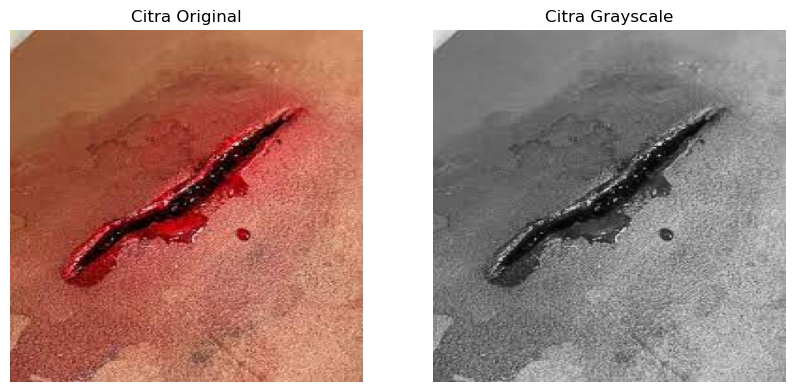

In [7]:
img = cv.imread(pick('cut', 15))
img_grayscale = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

fig, axes = plt.subplots(1, 2,figsize=(10, 5))
axes[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
axes[0].set_title("Citra Original")
axes[0].axis('off')
axes[1].imshow(img_grayscale, cmap='gray')
axes[1].set_title("Citra Grayscale")
axes[1].axis('off')
plt.show()

### Binary Thresholding

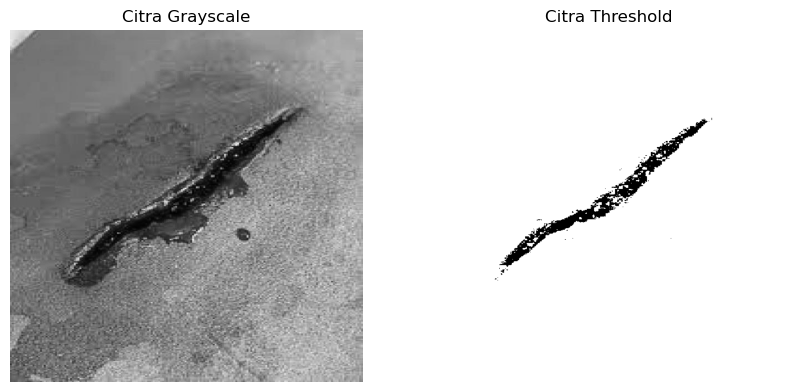

In [8]:
ret, thresh = cv.threshold(img_grayscale, 25, 255, cv.THRESH_BINARY)

fig, axes = plt.subplots(1, 2,figsize=(10, 5))
axes[0].imshow(img_grayscale, cmap='gray')
axes[0].set_title("Citra Grayscale")
axes[0].axis('off')
axes[1].imshow(thresh, cmap='gray')
axes[1].set_title("Citra Threshold")
axes[1].axis('off')
plt.show()

### Segmentasi dengan Contour Detection

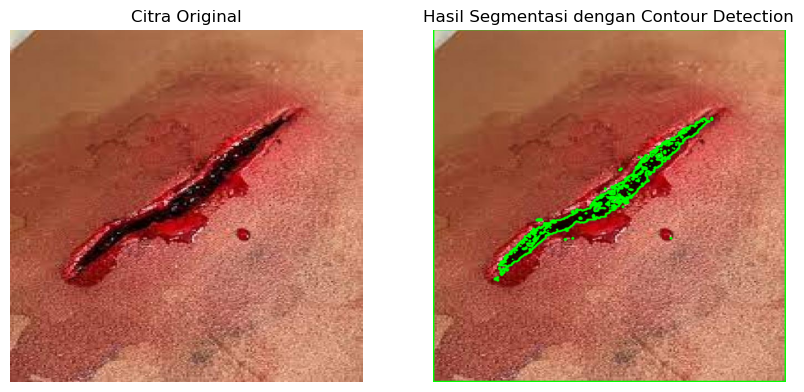

MSE : 4.511886393229167
PSNR: 20.79361102523311


In [9]:
contours, hierarchy = cv.findContours(image=thresh, mode=cv.RETR_TREE, method=cv.CHAIN_APPROX_NONE)
image_copy = img.copy()
cv.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv.LINE_AA)

fig, axes = plt.subplots(1, 2,figsize=(10, 5))
axes[0].imshow(img[...,::-1], cmap='gray')
axes[0].set_title("Citra Original")
axes[0].axis('off')
axes[1].imshow(image_copy[...,::-1], cmap='gray')
axes[1].set_title("Hasil Segmentasi dengan Contour Detection")
axes[1].axis('off')
plt.show()

selisih = np.array(image_copy) - np.array(img)
mse = np.mean(np.square(selisih))
psnr = 10 * np.log10(255 / np.sqrt(mse))
print("MSE :", mse)
print("PSNR:", psnr)

## Penerapan Active Contour pada Citra yang terdapat pada Datasets

### Fungsi Active Contour

In [10]:
def seg_active_contour(folder, nomor, bright, x, a, y, b):
    citra = cv.imread(pick(folder, nomor))
    citra_grayscale = cv.cvtColor(citra, cv.COLOR_BGR2GRAY)
    brightness = bright
    citra_brightened = cv.add(citra_grayscale, brightness)
    citra_denoise = cv.medianBlur(citra_brightened, 3)
    citra_denoise = cv.fastNlMeansDenoising(citra_denoise, None, 10, 10, 7)
    citra_contrast_adjusted = cv.equalizeHist(citra_denoise)
    s = np.linspace(0, 2*np.pi, 500)
    r = x + a*np.sin(s)
    c = y + b*np.cos(s)
    init = np.array([r, c]).T
    snake = active_contour(gaussian(citra_contrast_adjusted, 3, preserve_range=False),
                           init, alpha=0.01, beta=0, gamma=0.001)
    
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].set_title("Citra Original")
    axes[0].imshow(citra[..., ::-1], cmap='gray')
    axes[0].axis('off')
    axes[1].imshow(citra[..., ::-1], cmap='gray')
    axes[1].plot(snake[:, 1], snake[:, 0], '-w', lw=3)
    axes[1].set_title("Hasil Segmentasi dengan Active Contour")
    axes[1].axis('off')
    plt.show()
    selisih = np.array(citra_denoise) - np.array(citra[:, :, 0])
    mse = np.mean(np.square(selisih))
    psnr = 10 * np.log10(255 / np.sqrt(mse))
    print("MSE: ", mse)
    print("PSNR: ", psnr)

#### 1. Citra abrasion(3).jpg

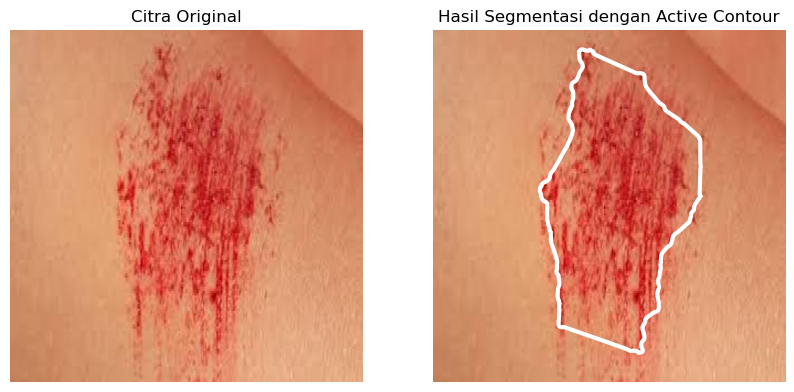

MSE:  104.5105419921875
PSNR:  13.969601304347288


In [11]:
seg_active_contour(folder='abrasions', nomor=3, bright=144, x=300, a=300, y=320, b=300)

#### 2. Citra bruises(2).jpg

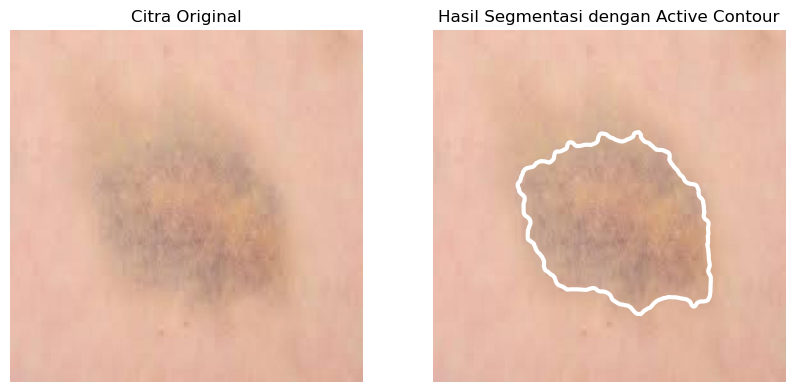

MSE:  120.726689453125
PSNR:  13.656385346111168


In [12]:
seg_active_contour(folder='bruises', nomor=2, bright=75, x=300, a=300, y=320, b=300)

#### 3. Citra burns(36).jpg

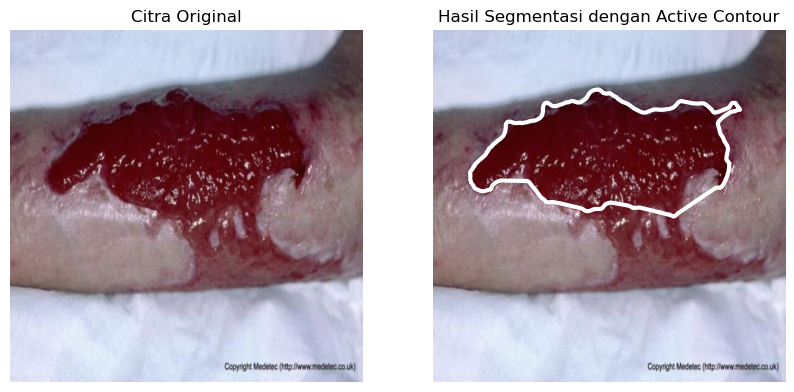

MSE:  106.11888671875
PSNR:  13.93643837834029


In [13]:
seg_active_contour(folder='burns', nomor=36, bright=215, x=300, a=300, y=320, b=300)

#### 4. Citra cut(15).jpg

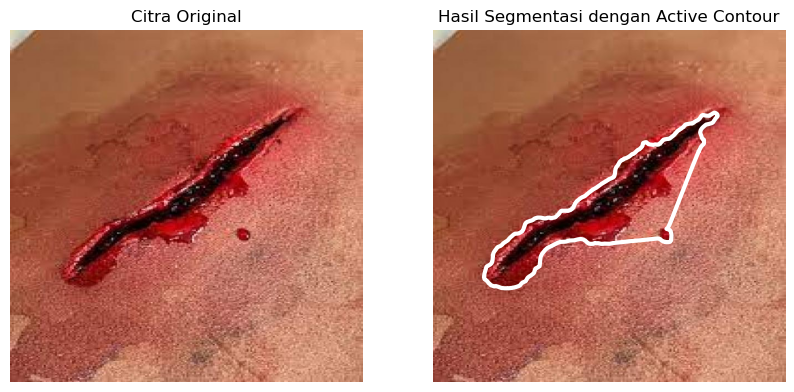

MSE:  107.27428466796874
PSNR:  13.912923668194342


In [14]:
seg_active_contour(folder='cut', nomor=15, bright=200, x=300, a=300, y=320, b=300)

#### 5. Citra laceration(15).jpg

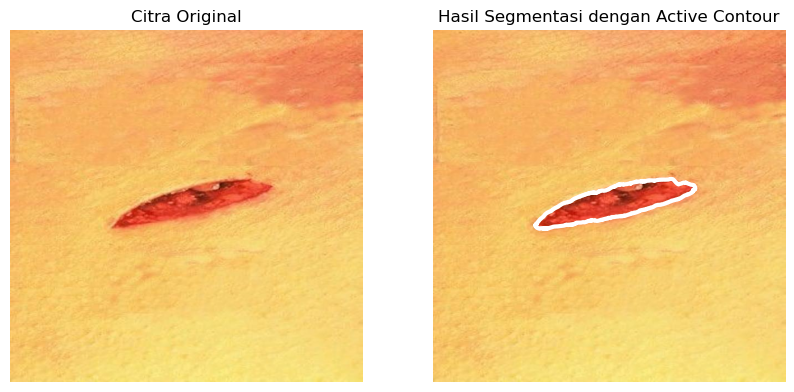

MSE:  106.0224560546875
PSNR:  13.93841250123522


In [15]:
seg_active_contour(folder='laceration', nomor=15, bright=120, x=300, a=300, y=320, b=300)

#### 6. Citra ingrown_nail(4).jpg

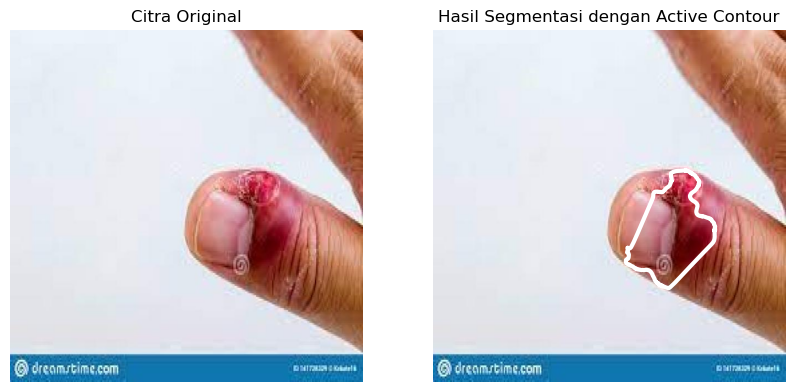

MSE:  98.7982080078125
PSNR:  14.091656466997389


In [16]:
seg_active_contour(folder='ingrown_nails', nomor=4, bright=146, x=320, a=150, y=360, b=150)

#### 7. Citra stab_wound(5).jpg

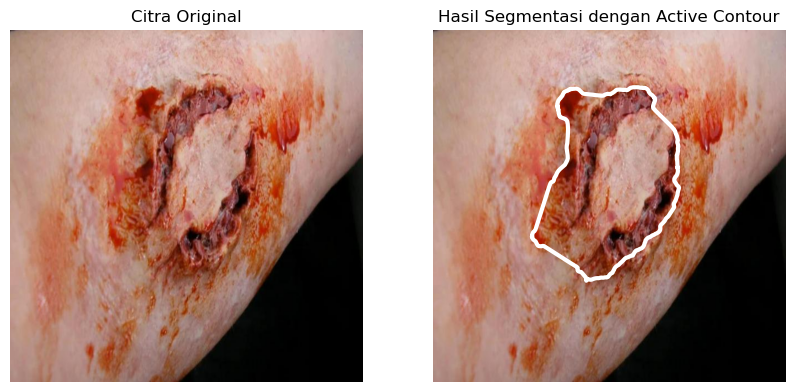

MSE:  108.4582080078125
PSNR:  13.889089681527595


In [17]:
seg_active_contour(folder='stab_wound', nomor=5, bright=180, x=250, a=200, y=250, b=200)

#### 8. Citra abrasions(1).jpg

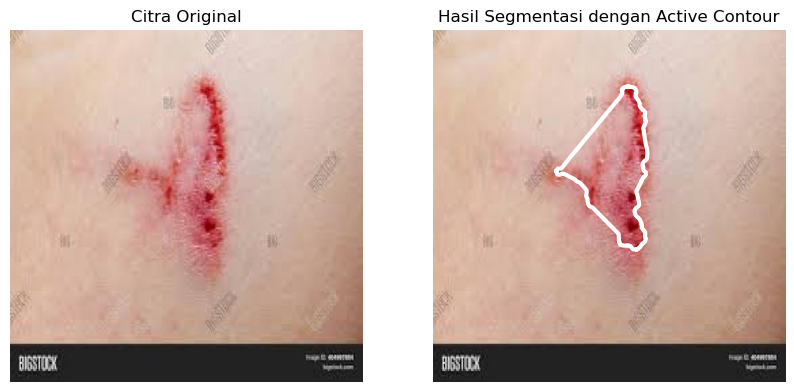

MSE:  111.229306640625
PSNR:  13.834305654286798


In [18]:
seg_active_contour(folder='abrasions', nomor=1, bright=140, x=300, a=200, y=320, b=130)

#### 9. Citra bruises(1).jpg

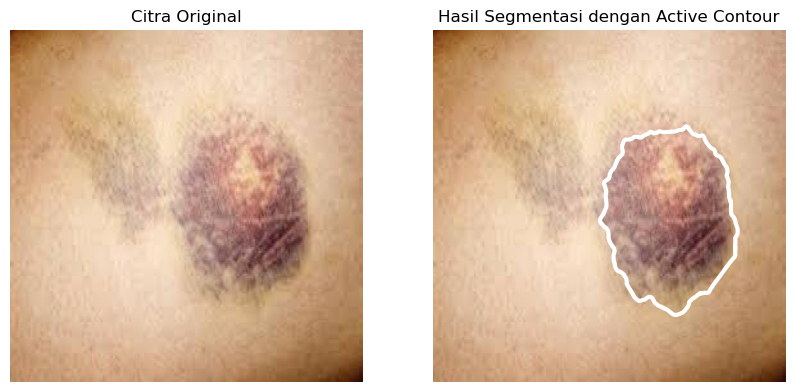

MSE:  88.656787109375
PSNR:  14.32684186148961


In [19]:
seg_active_contour(folder='bruises', nomor=1, bright=80, x=300, a=200, y=430, b=130)

#### 10. Citra burns(24).jpg

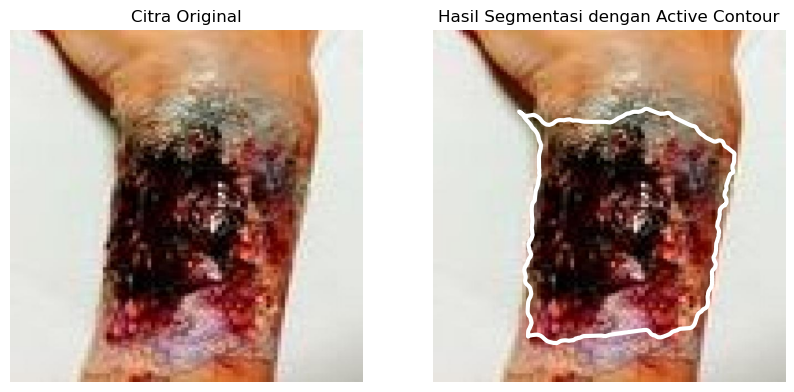

MSE:  111.52376708984374
PSNR:  13.828564650556407


In [20]:
seg_active_contour(folder='burns', nomor=24, bright=160, x=350, a=220, y=300, b=300)

#### 11. Citra abrasions(19).jpg

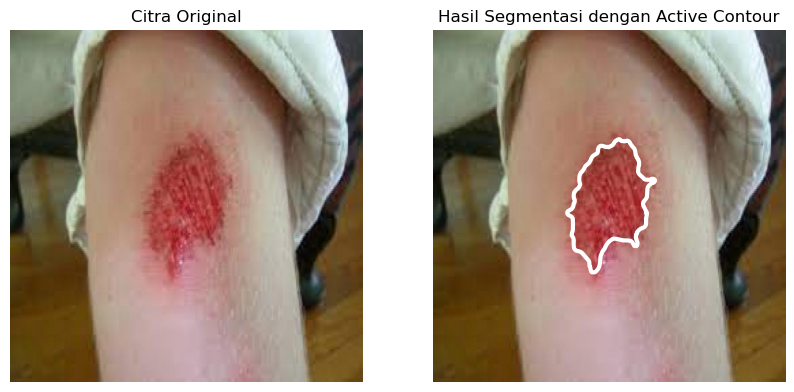

MSE:  105.6722607421875
PSNR:  13.945596810453688


In [21]:
seg_active_contour(folder='abrasions', nomor=19, bright=150, x=400, a=200, y=320, b=130)

#### 12. Citra bruises(9).jpg

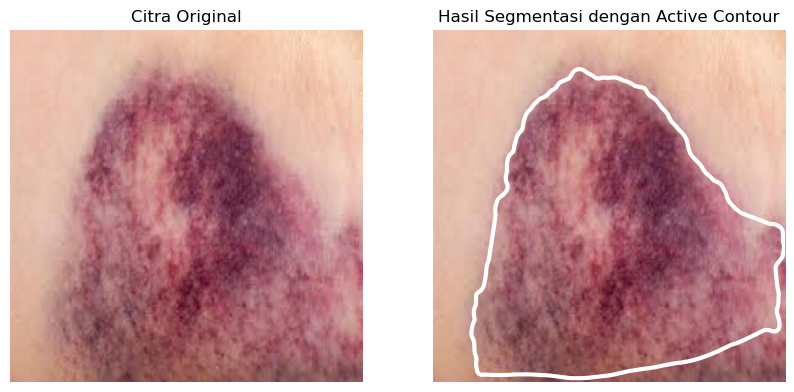

MSE:  112.93029052734374
PSNR:  13.801349577244293


In [22]:
seg_active_contour(folder='bruises', nomor=9, bright=100, x=350, a=450, y=320, b=450)

#### 13. Citra burns(22).jpg

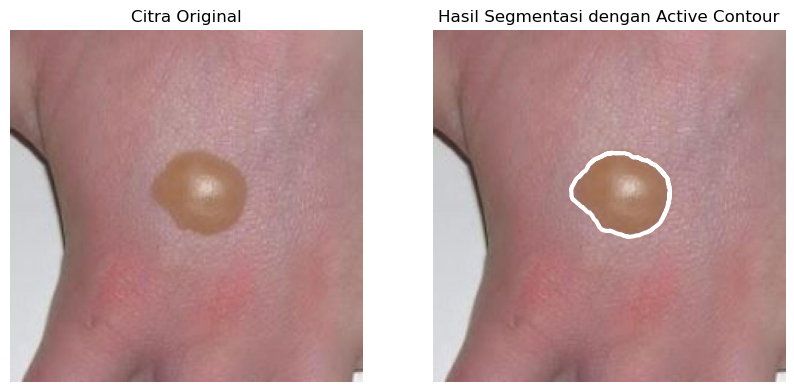

MSE:  65.01243408203125
PSNR:  15.000419672142055


In [23]:
seg_active_contour(folder='burns', nomor=22, bright=120, x=280, a=100, y=350, b=100)

#### 14. Citra cut(1).jpg

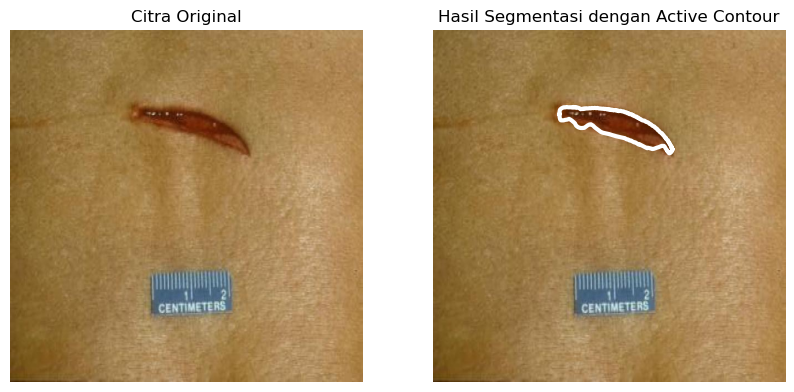

MSE:  114.54625732421874
PSNR:  13.770497286079276


In [24]:
seg_active_contour(folder='cut', nomor=1, bright=180, x=300, a=300, y=320, b=300)

#### 15. Citra laceration(2).jpg

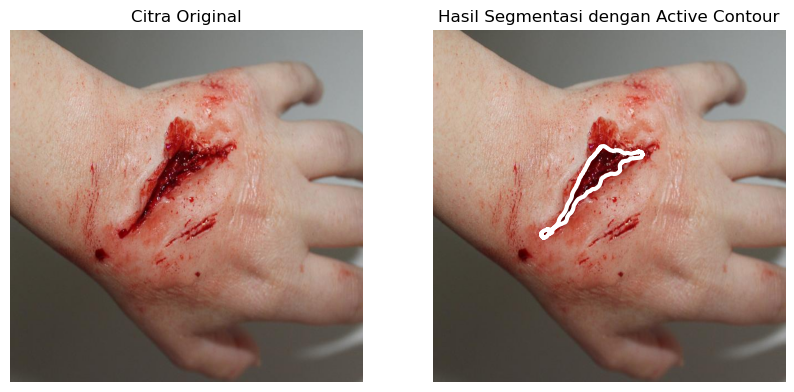

MSE:  107.74169921875
PSNR:  13.903482701236438


In [25]:
seg_active_contour(folder='laceration', nomor=2, bright=215, x=300, a=150, y=320, b=150)

#### 16. Citra ingrown_nail(26).jpg

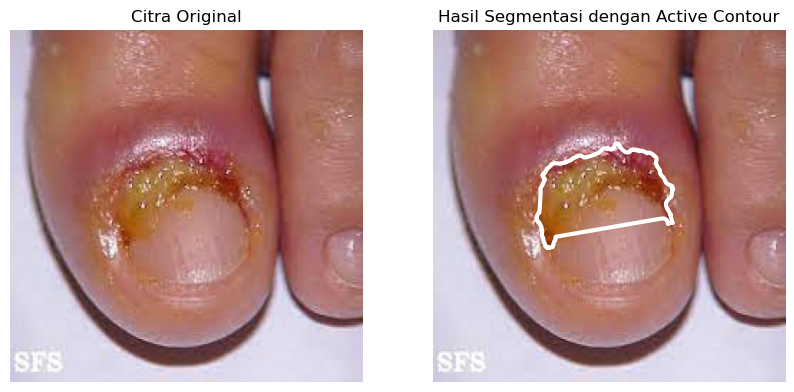

MSE:  109.40889404296875
PSNR:  13.870138664335183


In [26]:
seg_active_contour(folder='ingrown_nails', nomor=26, bright=160, x=340, a=150, y=300, b=150)

#### 17. Citra stab_wound(8).jpg

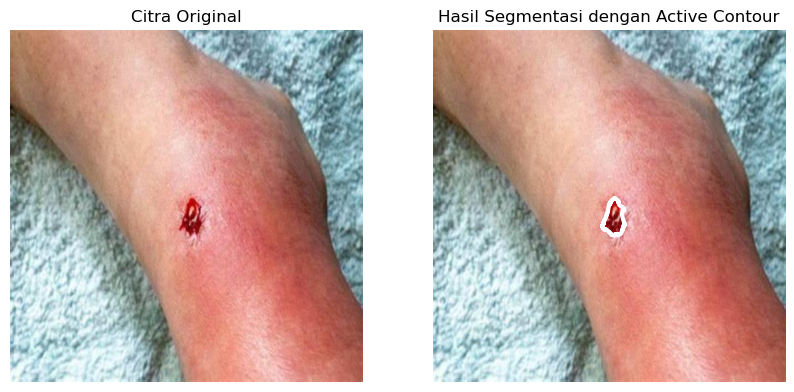

MSE:  101.97803466796876
PSNR:  14.02286861463692


In [27]:
seg_active_contour(folder='stab_wound', nomor=8, bright=180, x=300, a=200, y=300, b=200)

#### 18. Citra cut(2).jpg

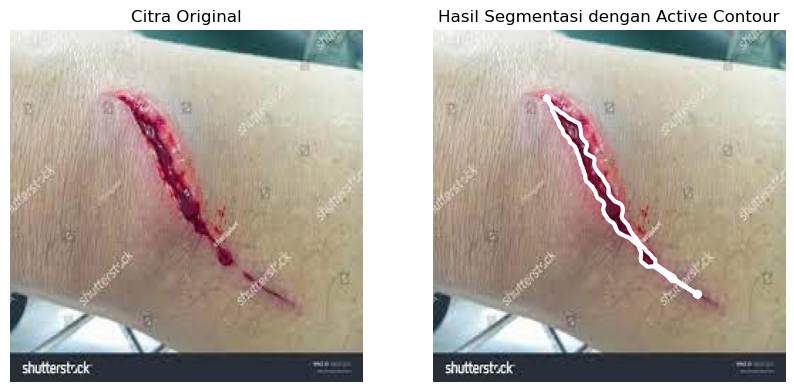

MSE:  98.36519775390624
PSNR:  14.10119445735112


In [28]:
seg_active_contour(folder='cut', nomor=2, bright=200, x=300, a=250, y=320, b=250)

#### 19. Citra laceration(10).jpg

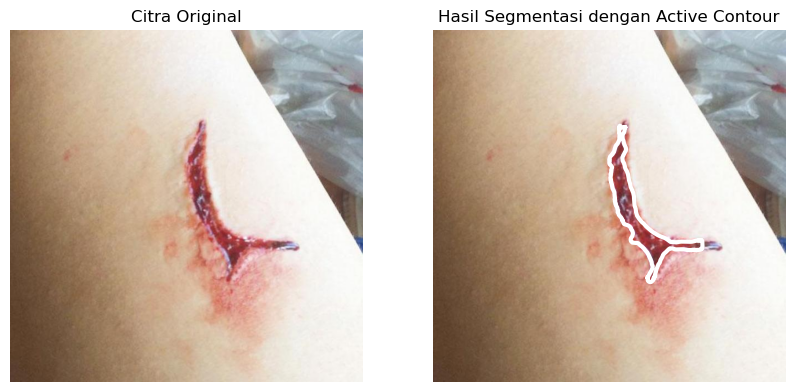

MSE:  107.469384765625
PSNR:  13.908977991035744


In [29]:
seg_active_contour(folder='laceration', nomor=10, bright=140, x=300, a=200, y=400, b=100)

#### 20. Citra ingrown_nail(28).jpg

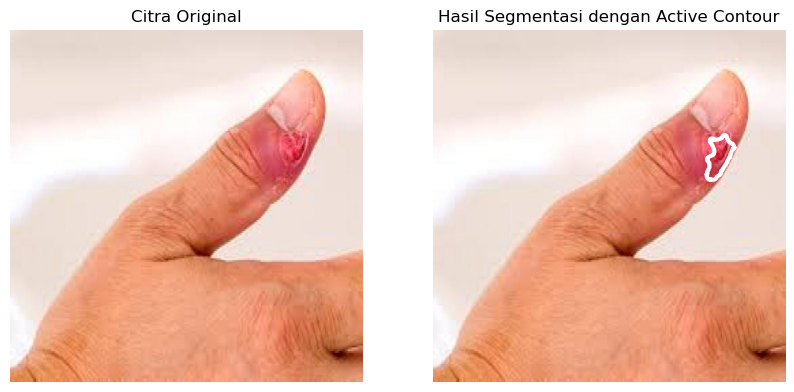

MSE:  99.19609375
PSNR:  14.08292895245082


In [30]:
seg_active_contour(folder='ingrown_nails', nomor=28, bright=157, x=150, a=150, y=430, b=150)

#### 21. Citra abrasions(17).jpg

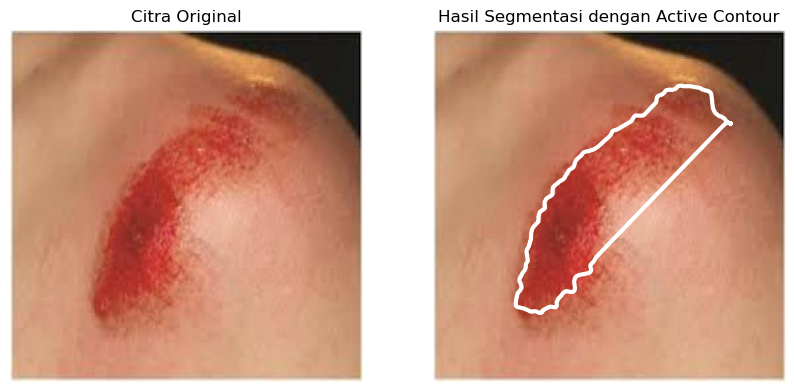

MSE:  96.09636474609376
PSNR:  14.151867009627068


In [31]:
seg_active_contour(folder='abrasions', nomor=17, bright=155, x=300, a=250, y=320, b=240)

#### 22. Citra bruises(18).jpg

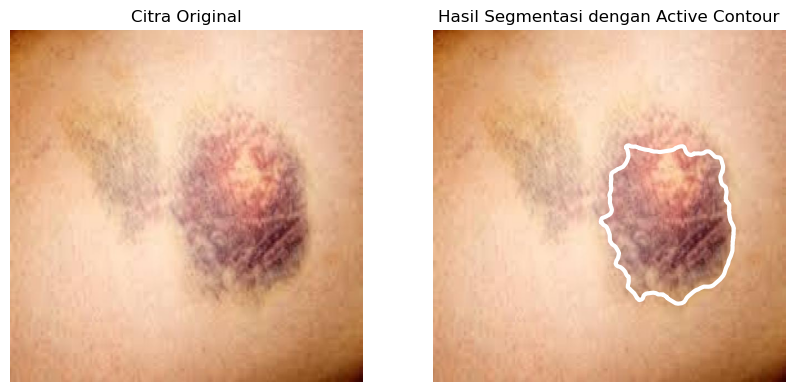

MSE:  100.79621826171875
PSNR:  14.04818061298236


In [32]:
seg_active_contour(folder='bruises', nomor=18, bright=90, x=300, a=200, y=350, b=200)

#### 23. Citra burns(22).jpg

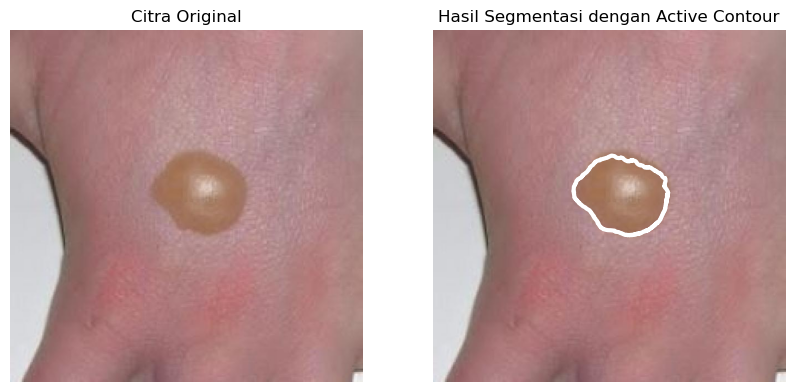

MSE:  80.837060546875
PSNR:  14.527349239269792


In [33]:
seg_active_contour(folder='burns', nomor=22, bright=125, x=300, a=150, y=380, b=150)

#### 24. Citra cut(20).jpg 

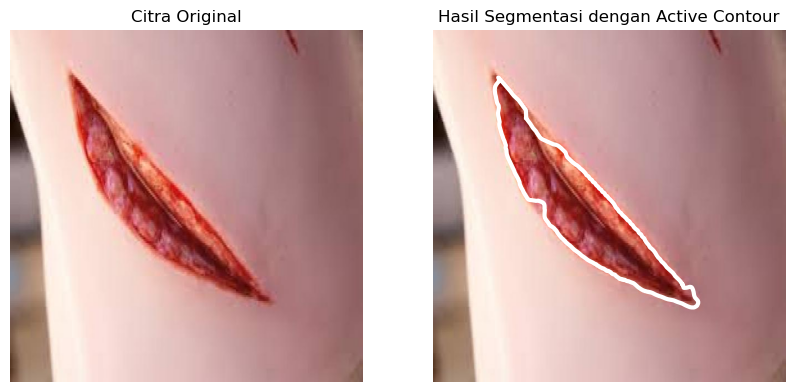

MSE:  102.31765869140625
PSNR:  14.015648835661134


In [34]:
seg_active_contour(folder='cut', nomor=20, bright=126, x=300, a=400, y=290, b=200)

#### 25. Citra laceration(14).jpg

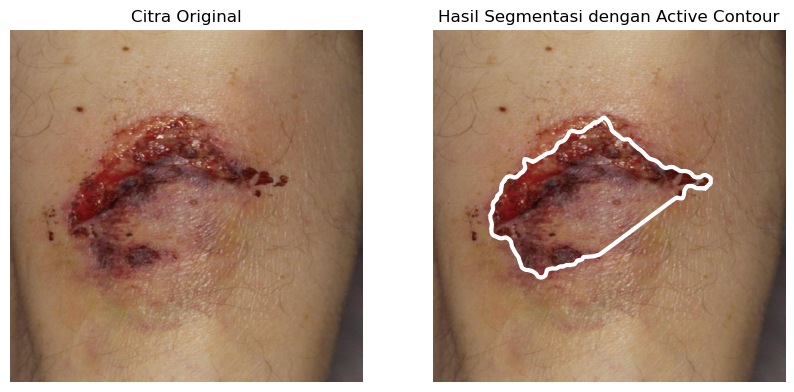

MSE:  109.36552490234375
PSNR:  13.870999595827806


In [35]:
seg_active_contour(folder='laceration', nomor=14, bright=180, x=300, a=200, y=300, b=200)

#### 26. Citra ingrown_nail(16).jpg

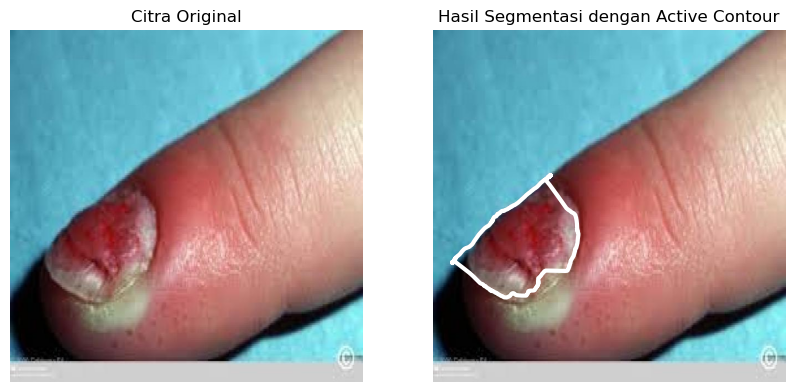

MSE:  105.540400390625
PSNR:  13.948308117162206


In [36]:
seg_active_contour(folder='ingrown_nails', nomor=16, bright=144, x=360, a=120, y=140, b=120)

#### 27. Citra stab_wound(20).jpg

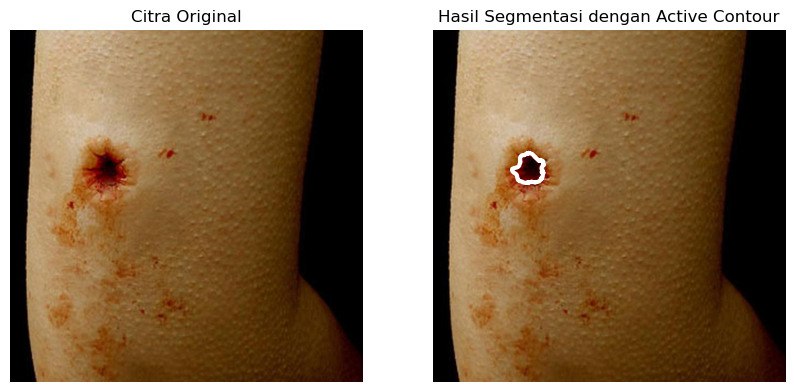

MSE:  106.71110107421875
PSNR:  13.924353798852714


In [37]:
seg_active_contour(folder='stab_wound', nomor=20, bright=215, x=300, a=200, y=250, b=200)

#### 28. Citra stab_wound(23).jpg

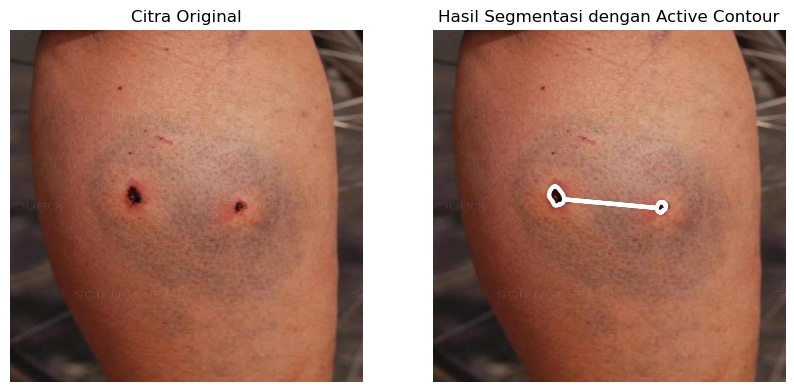

MSE:  109.95416015625
PSNR:  13.859343475840792


In [38]:
seg_active_contour(folder='stab_wound', nomor=23, bright=190, x=300, a=200, y=350, b=200)

#### 29. Citra cut(26).jpg

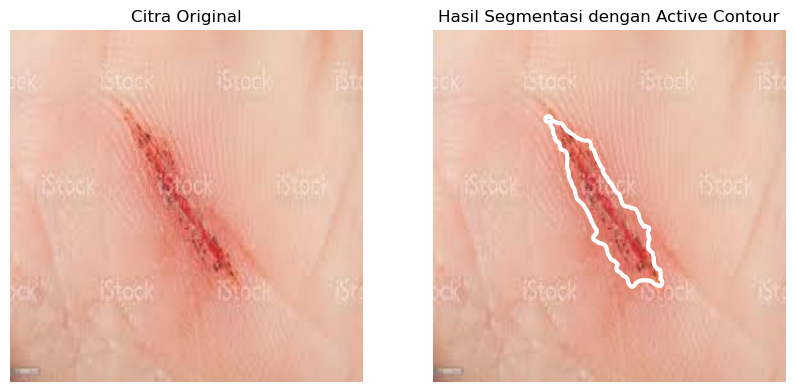

MSE:  118.2706005859375
PSNR:  13.701017793375996


In [39]:
seg_active_contour(folder='cut', nomor=26, bright=100, x=300, a=200, y=300, b=200)

#### 30. Citra laceration(20).jpg

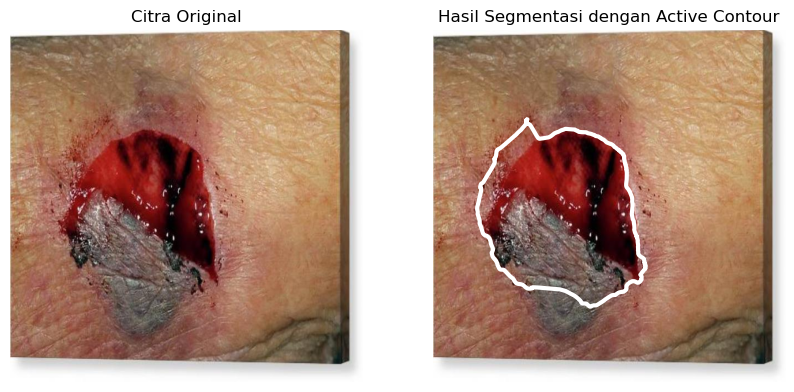

MSE:  106.39479736328126
PSNR:  13.930799845543508


In [40]:
seg_active_contour(folder='laceration', nomor=20, bright=185, x=300, a=200, y=280, b=200)

### Fungsi Metode Contour Detection

In [41]:
def seg_contour_detection(folder, nomor, threshold):
    img = cv.imread(pick(folder, nomor))
    img_grayscale = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    ret, thresh = cv.threshold(img_grayscale, threshold, 255, cv.THRESH_BINARY)
    contours, hierarchy = cv.findContours(image=thresh, mode=cv.RETR_TREE, method=cv.CHAIN_APPROX_NONE)
    image_copy = img.copy()
    cv.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv.LINE_AA)
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(img[..., ::-1], cmap='gray')
    axes[0].set_title("Citra Original")
    axes[0].axis('off')
    axes[1].imshow(image_copy[..., ::-1], cmap='gray')
    axes[1].set_title("Hasil Segmentasi dengan Contour Detection")
    axes[1].axis('off')
    plt.show()
    selisih = np.array(image_copy) - np.array(img)
    mse = np.mean(np.square(selisih))
    psnr = 10 * np.log10(255 / np.sqrt(mse))
    print("MSE: ", mse)
    print("PSNR: ", psnr)

#### 1. Citra abrasion(3).jpg

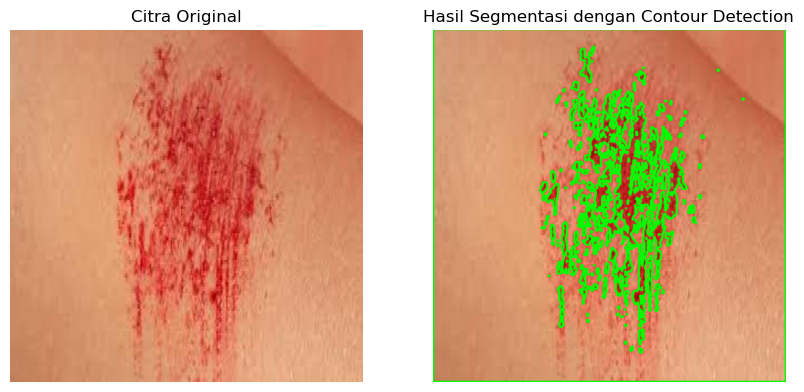

MSE:  16.330721842447918
PSNR:  18.000374896190987


In [42]:
seg_contour_detection(folder='abrasions', nomor=3, threshold=110)

#### 2. Citra bruises(2).jpg

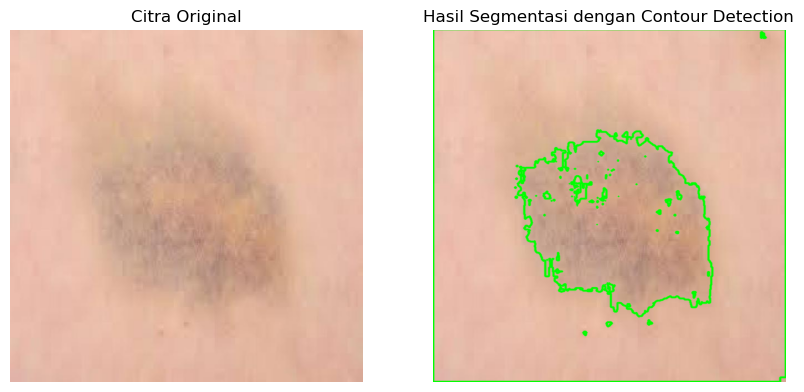

MSE:  6.257376302083333
PSNR:  20.083440438909975


In [43]:
seg_contour_detection(folder='bruises', nomor=2, threshold=180)

#### 3. Citra burns(36).jpg

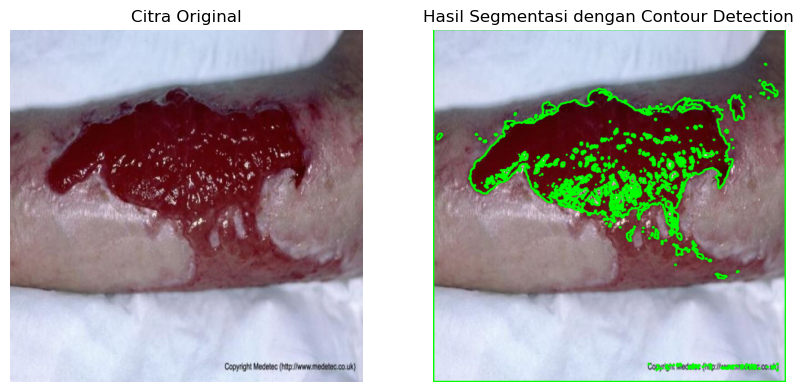

MSE:  11.744868977864583
PSNR:  18.716160922912685


In [44]:
seg_contour_detection(folder='burns', nomor=36, threshold=50)

#### 4. Citra cut(15).jpg

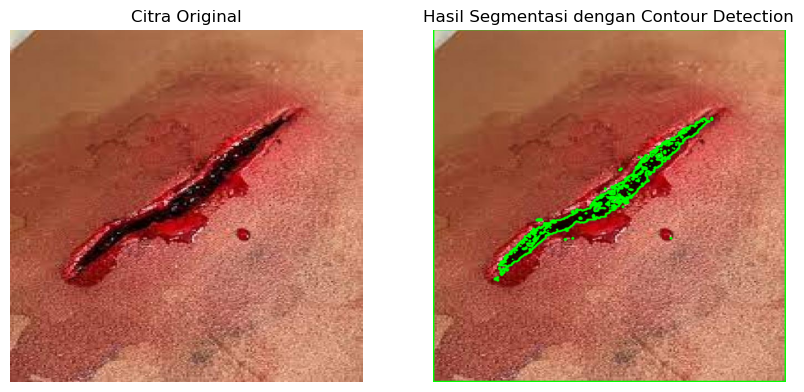

MSE:  4.511886393229167
PSNR:  20.79361102523311


In [45]:
seg_contour_detection(folder='cut', nomor=15, threshold=25)

#### 5. Citra laceration(15).jpg

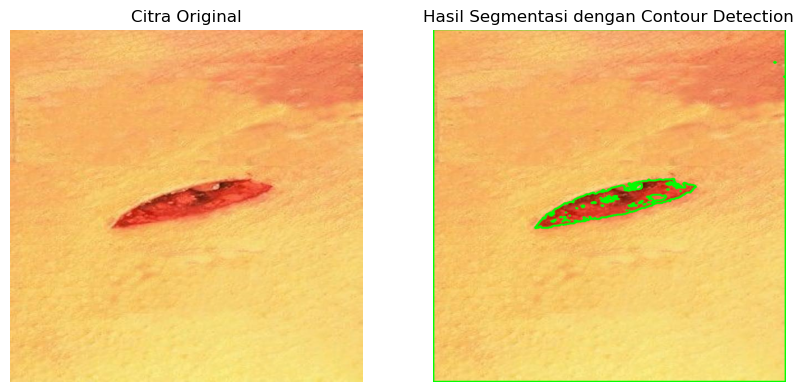

MSE:  3.4274853515625
PSNR:  21.390523767482815


In [46]:
seg_contour_detection(folder='laceration', nomor=15, threshold=130)

#### 6. Citra ingrown_nail(4).jpg

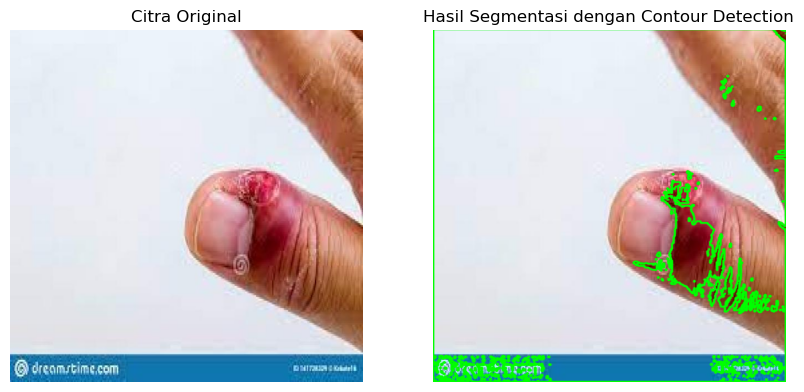

MSE:  8.271502278645833
PSNR:  19.477479835733433


In [47]:
seg_contour_detection(folder='ingrown_nails', nomor=4, threshold=82)

#### 7. Citra stab_wound(5).jpg

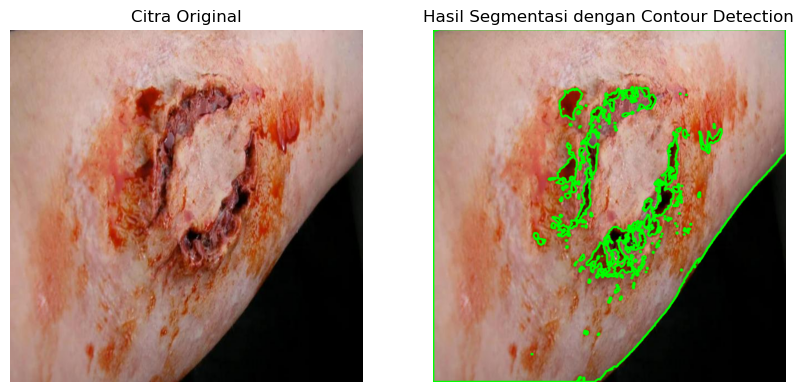

MSE:  8.757164713541666
PSNR:  19.353584212184924


In [48]:
seg_contour_detection(folder='stab_wound', nomor=5, threshold=70)

#### 8. Citra abrasions(1).jpg

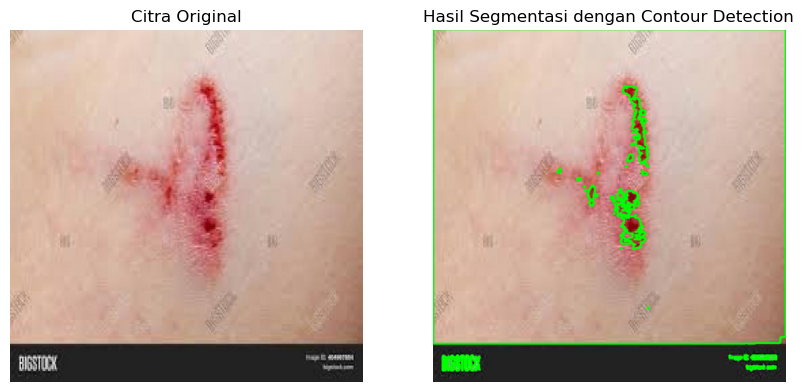

MSE:  5.284108072916666
PSNR:  20.45054334725828


In [49]:
seg_contour_detection(folder='abrasions', nomor=1, threshold=110)

#### 9. Citra bruises(1).jpg

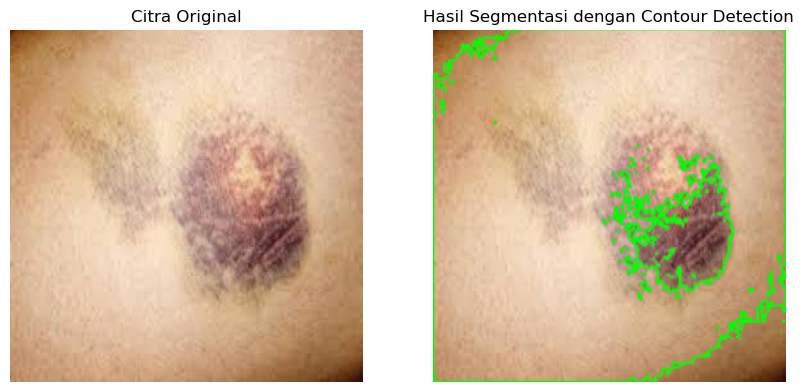

MSE:  6.940927734375
PSNR:  19.858314190543823


In [50]:
seg_contour_detection(folder='bruises', nomor=1, threshold=140)

#### 10. Citra burns(24).jpg

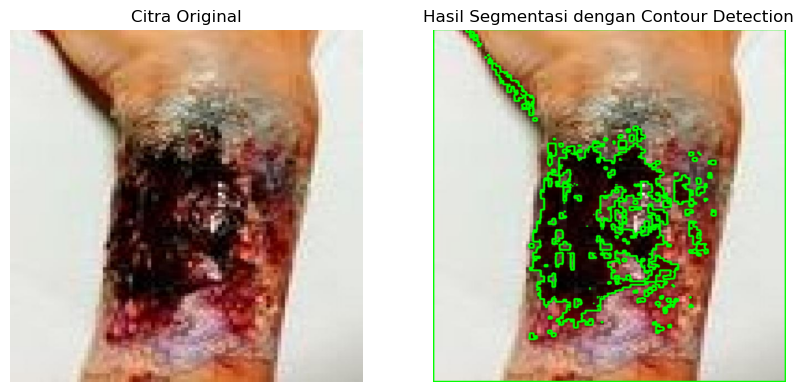

MSE:  10.64259765625
PSNR:  18.930163584617567


In [51]:
seg_contour_detection(folder='burns', nomor=24, threshold=35)

#### 11. Citra abrasions(19).jpg

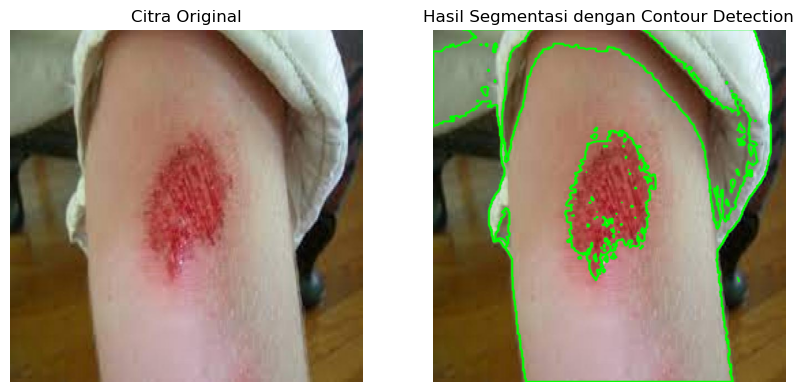

MSE:  7.775297037760416
PSNR:  19.611816858034167


In [52]:
seg_contour_detection(folder='abrasions', nomor=19, threshold=124)

#### 12. Citra bruises(9).jpg

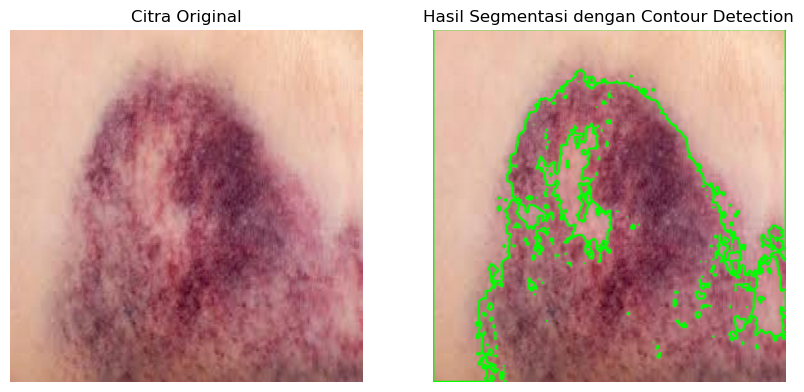

MSE:  7.937057291666667
PSNR:  19.5671042285233


In [53]:
seg_contour_detection(folder='bruises', nomor=9, threshold=144)

#### 13. Citra burns(22).jpg

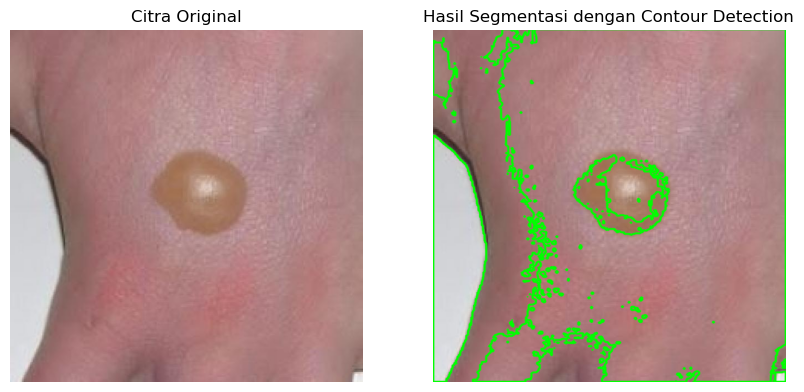

MSE:  9.284087727864584
PSNR:  19.226705626491086


In [54]:
seg_contour_detection(folder='burns', nomor=22, threshold=128)

#### 14. Citra cut(1).jpg

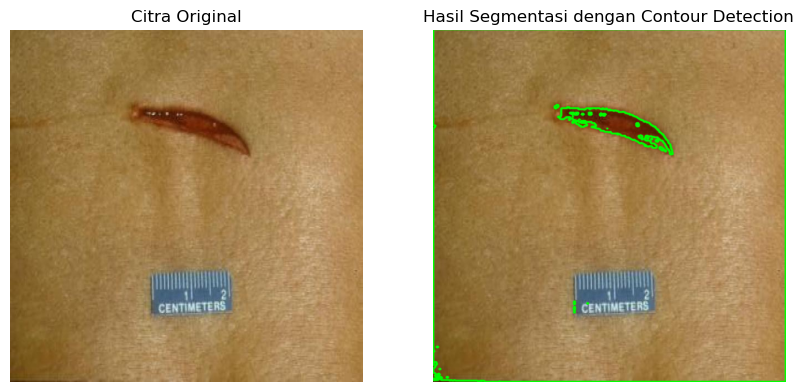

MSE:  3.18395751953125
PSNR:  21.550565480676344


In [55]:
seg_contour_detection(folder='cut', nomor=1, threshold=76)

#### 15. Citra laceration(2).jpg

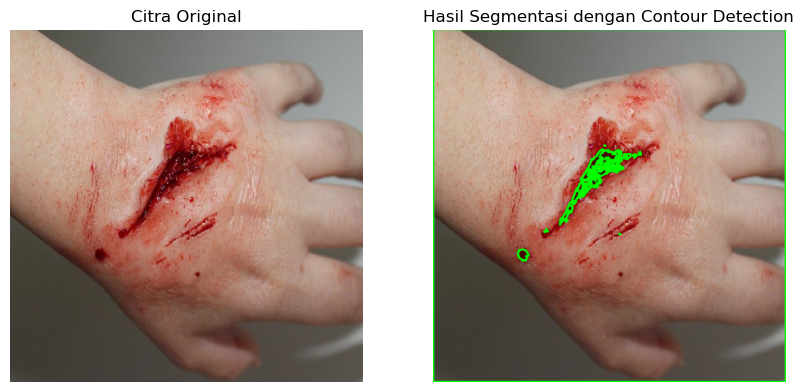

MSE:  3.2078898111979166
PSNR:  21.534304593577218


In [56]:
seg_contour_detection(folder='laceration', nomor=2, threshold=31)

#### 16. Citra ingrown_nail(26).jpg

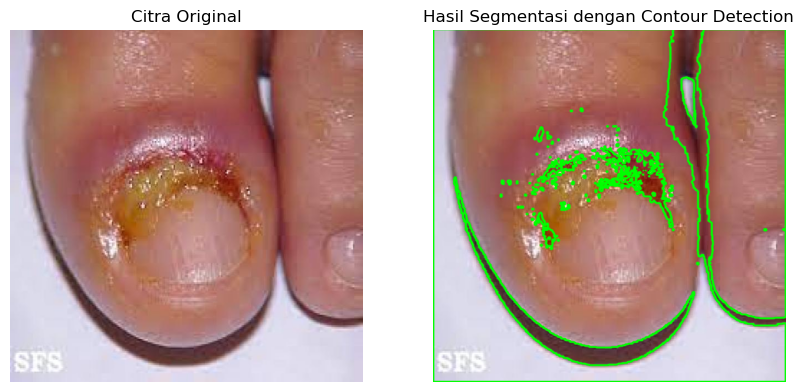

MSE:  9.83840087890625
PSNR:  19.1007792318498


In [57]:
seg_contour_detection(folder='ingrown_nails', nomor=26, threshold=93)

#### 17. Citra stab_wound(8).jpg

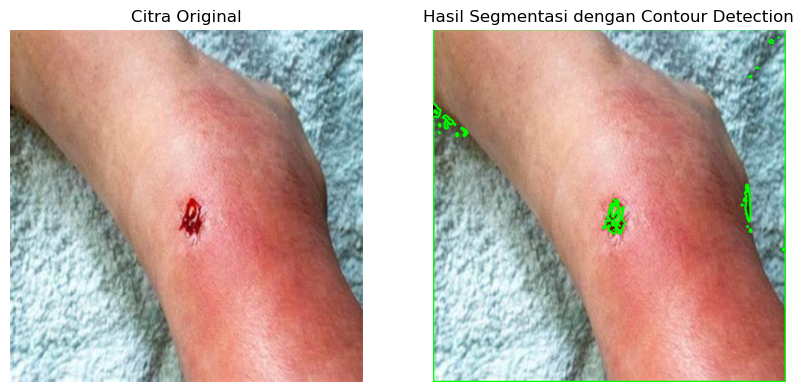

MSE:  3.0479964192708335
PSNR:  21.6453295420054


In [58]:
seg_contour_detection(folder='stab_wound', nomor=8, threshold=55)

#### 18. Citra cut(2).jpg

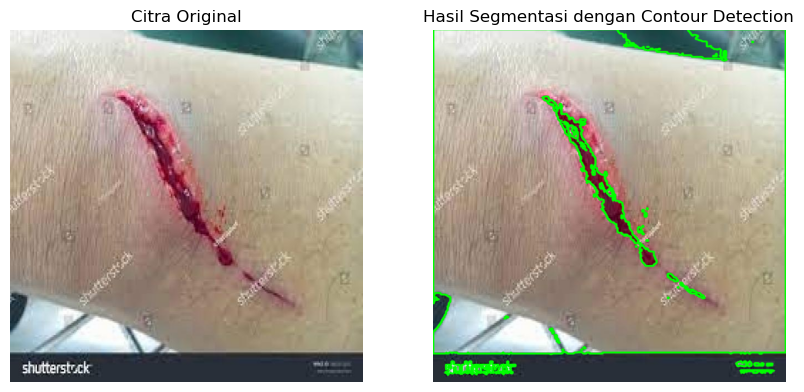

MSE:  6.164588216145833
PSNR:  20.115881445445936


In [59]:
seg_contour_detection(folder='cut', nomor=2, threshold=75)

#### 19. Citra laceration(10).jpg

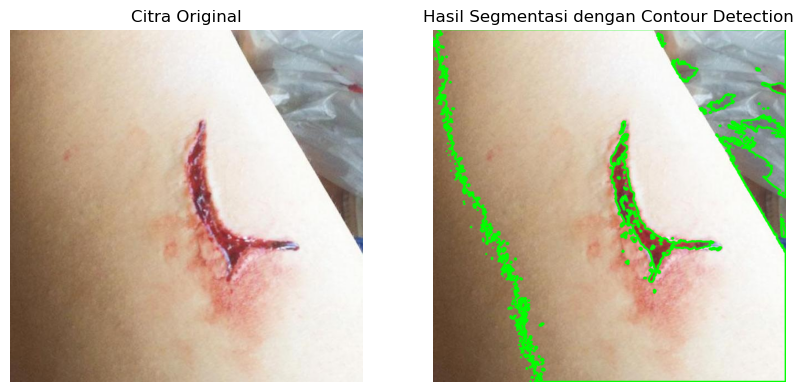

MSE:  7.521534016927084
PSNR:  19.68386968439685


In [60]:
seg_contour_detection(folder='laceration', nomor=10, threshold=125)

#### 20. Citra ingrown_nail(28).jpg

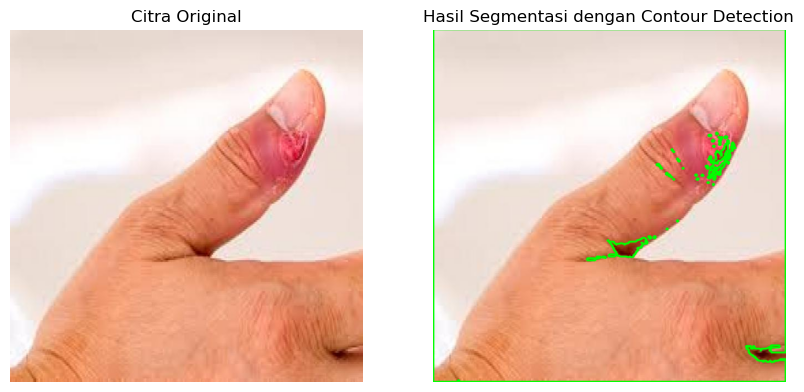

MSE:  3.6859334309895835
PSNR:  21.232664366982


In [61]:
seg_contour_detection(folder='ingrown_nails', nomor=28, threshold=95)

#### 21. Citra abrasions(17).jpg

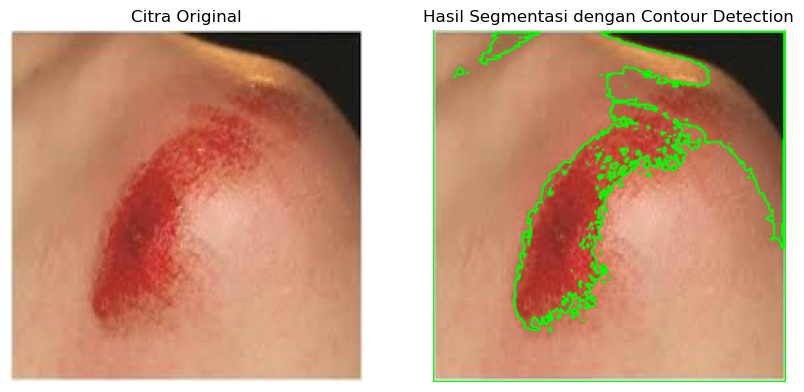

MSE:  8.685899251302084
PSNR:  19.37132786620903


In [62]:
seg_contour_detection(folder='abrasions', nomor=17, threshold=126)

#### 22. Citra bruises(18).jpg

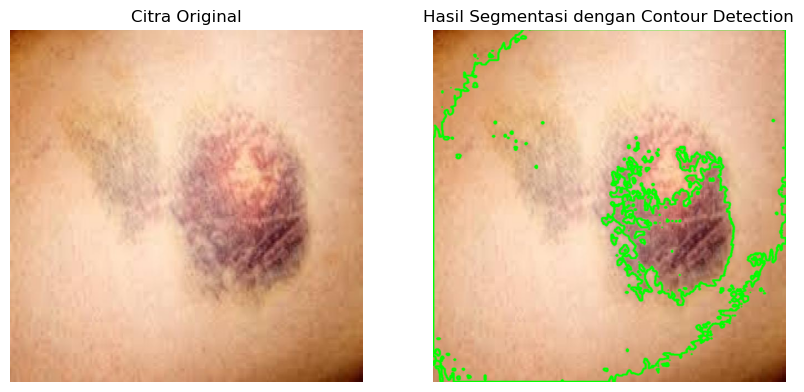

MSE:  9.736570638020833
PSNR:  19.123371709494275


In [63]:
seg_contour_detection(folder='bruises', nomor=18, threshold=160)

#### 23. Citra burns(22).jpg

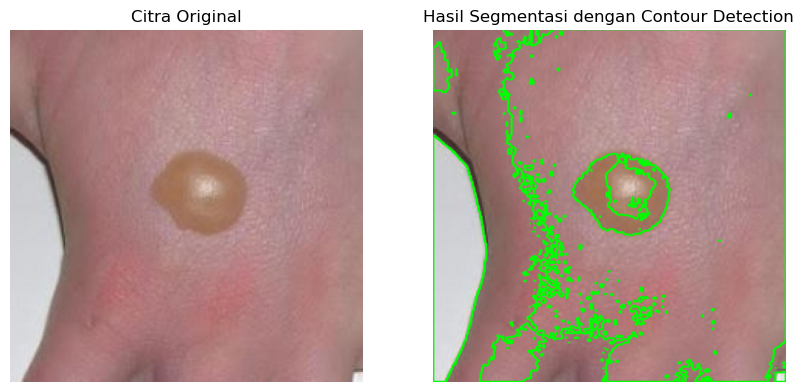

MSE:  10.852112630208333
PSNR:  18.887830341836775


In [64]:
seg_contour_detection(folder='burns', nomor=22, threshold=131)

#### 24. Citra cut(9).jpg

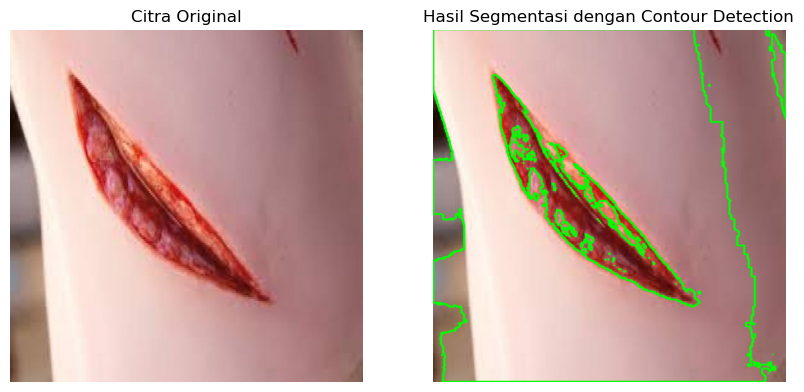

MSE:  8.041802571614584
PSNR:  19.53863477007413


In [65]:
seg_contour_detection(folder='cut', nomor=20, threshold=125)

#### 25. Citra laceration(14).jpg

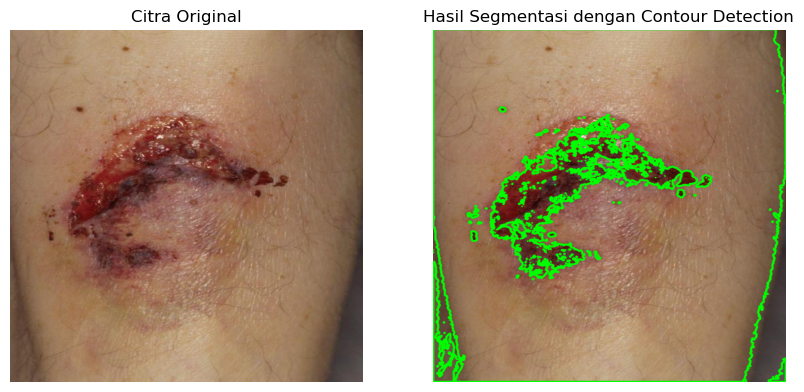

MSE:  10.804869791666667
PSNR:  18.89730411626796


In [66]:
seg_contour_detection(folder='laceration', nomor=14, threshold=80)

#### 26. Citra ingrown_nail(16).jpg

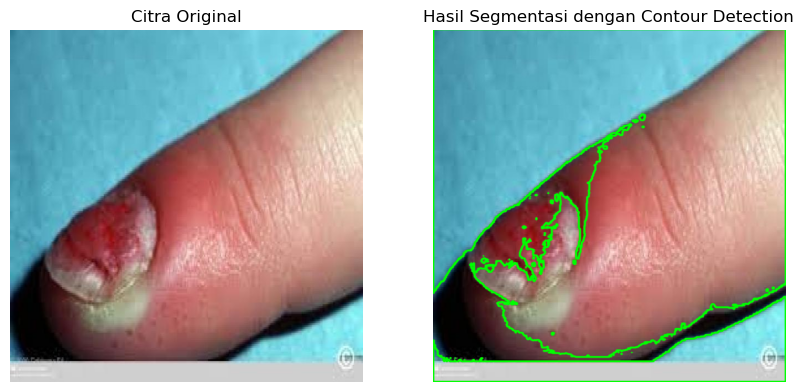

MSE:  6.7164111328125
PSNR:  19.92971544023255


In [67]:
seg_contour_detection(folder='ingrown_nails', nomor=16, threshold=80)

#### 27. Citra stab_wound(20).jpg

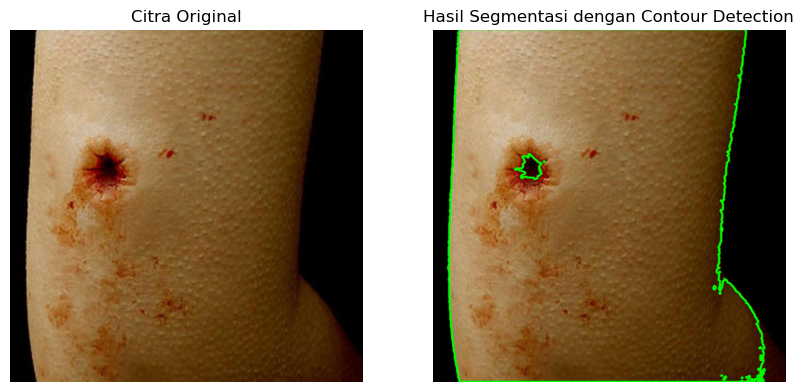

MSE:  2.7130696614583334
PSNR:  21.89809707954456


In [68]:
seg_contour_detection(folder='stab_wound', nomor=20, threshold=25)

#### 28. Citra stab_wound(23).jpg

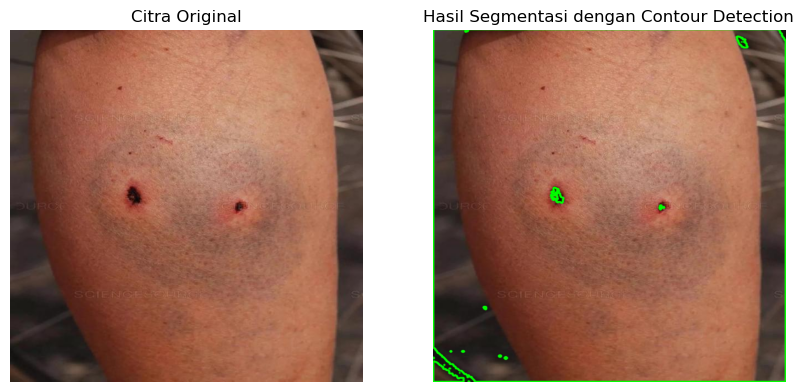

MSE:  2.6555875651041667
PSNR:  21.944598672448432


In [69]:
seg_contour_detection(folder='stab_wound', nomor=23, threshold=23)

#### 29. Citra cut().jpg

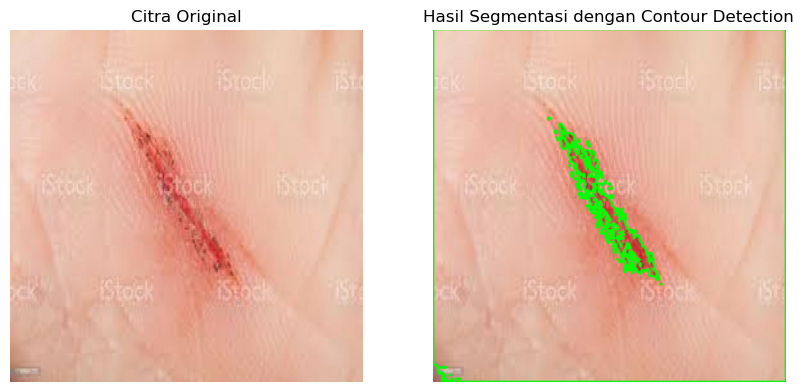

MSE:  5.248974609375
PSNR:  20.465029444437693


In [70]:
seg_contour_detection(folder='cut', nomor=26, threshold=140)

#### 30. Citra laceration(20).jpg 

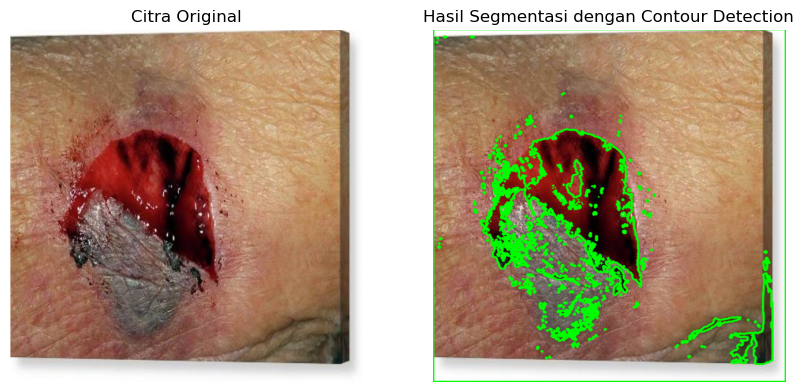

MSE:  11.565751953125
PSNR:  18.74953243485626


In [71]:
seg_contour_detection(folder='laceration', nomor=20, threshold=68)

### Pengujian Waktu Eksekusi

In [72]:
def metode_active_contour(folder, nomor):
    citra = cv.imread(pick(folder, nomor))
    citra_grayscale = cv.cvtColor(citra, cv.COLOR_BGR2GRAY)
    brightness = 200
    citra_brightened = cv.add(citra_grayscale, brightness)
    citra_denoise = cv.medianBlur(citra_brightened, 3)
    citra_denoise = cv.fastNlMeansDenoising(citra_denoise, None, 10, 10, 7)
    citra_contrast_adjusted = cv.equalizeHist(citra_denoise)
    s = np.linspace(0, 2*np.pi, 500)
    r = 300 + 300*np.sin(s)
    c = 320 + 300*np.cos(s)
    init = np.array([r, c]).T
    snake = active_contour(gaussian(citra_contrast_adjusted, 3, preserve_range=False),
                           init, alpha=0.01, beta=0, gamma=0.001)
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].set_title("Citra Original")
    axes[0].imshow(citra[..., ::-1], cmap='gray')
    axes[0].axis('off')
    axes[1].imshow(citra[..., ::-1], cmap='gray')
    axes[1].plot(snake[:, 1], snake[:, 0], '-w', lw=3)
    axes[1].set_title("Hasil Segmentasi dengan Active Contour")
    axes[1].axis('off')
    plt.show()
    selisih = np.array(citra_denoise) - np.array(citra[:, :, 0])
    mse = np.mean(np.square(selisih))
    psnr = 10 * np.log10(255 / np.sqrt(mse))
    print("MSE: ", mse)
    print("PSNR: ", psnr)
    
def metode_contour_detection(folder, nomor):
    img = cv.imread(pick(folder, nomor))
    img_grayscale = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    ret, thresh = cv.threshold(img_grayscale, 25, 255, cv.THRESH_BINARY)
    contours, hierarchy = cv.findContours(image=thresh, mode=cv.RETR_TREE, method=cv.CHAIN_APPROX_NONE)
    image_copy = img.copy()
    cv.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv.LINE_AA)
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(img[..., ::-1], cmap='gray')
    axes[0].set_title("Citra Original")
    axes[0].axis('off')
    axes[1].imshow(image_copy[..., ::-1], cmap='gray')
    axes[1].set_title("Hasil Segmentasi dengan Contour Detection")
    axes[1].axis('off')
    plt.show()
    selisih = np.array(image_copy) - np.array(img)
    mse = np.mean(np.square(selisih))
    psnr = 10 * np.log10(255 / np.sqrt(mse))
    print("MSE: ", mse)
    print("PSNR: ", psnr)